In [ ]:
!nvidia-smi


Thu Dec  4 17:12:22 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   60C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 55.8 MB/s eta 0:00:00


In [2]:
!pip install opencv-python pillow

In [3]:
from google.colab import drive
import os

# 1. Mount your Google Drive
# This authenticates the Colab session with your Google Drive account.
drive.mount('/content/drive')

# 2. Define the path to your project folder on Google Drive
# NOTE: Replace 'AI_Projects/Car_Damage_Detection' with your actual path!
# The path ALWAYS starts with '/content/drive/MyDrive/'
DRIVE_PATH = '/content/drive/MyDrive/AI_Projects/Car_Damage_Detection'

Mounted at /content/drive


In [4]:
import os

# Assuming DRIVE_PATH was defined as:
# DRIVE_PATH = '/content/drive/MyDrive/AI_Projects/Car_Damage_Detection'

yaml_content = f"""
path: {DRIVE_PATH} # dataset root dir
train: images/train  # train images (relative to 'path')
val: images/val      # val images (relative to 'path')

# Classes
nc: 6
names: ['dent', 'scratch', 'crack', 'glass_shatter', 'lamp_broken', 'tire_flat']
"""

with open('/content/dataset.yaml', 'w') as f:
    f.write(yaml_content)

print("✅ dataset.yaml created successfully at /content/dataset.yaml")

✅ dataset.yaml created successfully at /content/dataset.yaml


In [5]:
import os

# 1. Check if the directory exists
train_path = f"{DRIVE_PATH}/images/train"
if os.path.exists(train_path):
    files = os.listdir(train_path)
    print(f"✅ Folder found! It contains {len(files)} files.")
    if len(files) > 0:
        print(f"Sample files: {files[:5]}")
    else:
        print("❌ Folder is EMPTY. You need to move your images here.")
else:
    print(f"❌ Path NOT found: {train_path}. Check your DRIVE_PATH.")


✅ Folder found! It contains 3511 files.
Sample files: ['002635.jpg', '002638.jpg', '002639.jpg', '002640.jpg', '002641.jpg']


In [ ]:
# Create the target folders first
!mkdir -p {DRIVE_PATH}/images/train
!mkdir -p {DRIVE_PATH}/images/val

# Move damaged images from the raw CarDD folders (Check these paths in your Drive!)
# Screenshot shows they are in CarDD_release/CarDD_COCO/train2017
!cp -r {DRIVE_PATH}/CarDD_release/CarDD_COCO/train2017/*.jpg {DRIVE_PATH}/images/train/
!cp -r {DRIVE_PATH}/CarDD_release/CarDD_COCO/val2017/*.jpg {DRIVE_PATH}/images/val/

# Move undamaged images from your vehicle dataset
# Screenshots show they are in vehicle dataset/train/images and vehicle dataset/valid/images
!cp -r "{DRIVE_PATH}/vehicle dataset/train/images/"*.jpg {DRIVE_PATH}/images/train/
!cp -r "{DRIVE_PATH}/vehicle dataset/valid/images/"*.jpg {DRIVE_PATH}/images/val/

cp: cannot stat '/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/CarDD_release/CarDD_COCO/train2017/*.jpg': No such file or directory
cp: cannot stat '/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/CarDD_release/CarDD_COCO/val2017/*.jpg': No such file or directory
cp: cannot stat '/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/vehicle dataset/train/images/*.jpg': No such file or directory
cp: cannot stat '/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/vehicle dataset/valid/images/*.jpg': No such file or directory


In [ ]:
import os
train_dir = f"{DRIVE_PATH}/images/train"
if os.path.exists(train_dir):
    num_imgs = len([f for f in os.listdir(train_dir) if f.lower().endswith(('.jpg', '.png'))])
    print(f"✅ Found {num_imgs} images in {train_dir}")
else:
    print(f"❌ Directory not found: {train_dir}")

✅ Found 3511 images in /content/drive/MyDrive/AI_Projects/Car_Damage_Detection/images/train


In [6]:
yaml_content = f"""
path: {DRIVE_PATH}
train: images/train
val: images/val
nc: 6
names: ['dent', 'scratch', 'crack', 'glass_shatter', 'lamp_broken', 'tire_flat']
"""
with open('/content/dataset.yaml', 'w') as f:
    f.write(yaml_content)

In [ ]:
import os
import shutil

# 1. Create the final destination folders if they don't exist
os.makedirs(f"{DRIVE_PATH}/images/train", exist_ok=True)
os.makedirs(f"{DRIVE_PATH}/images/val", exist_ok=True)

# 2. Move DAMAGED images from CarDD (Based on Screenshot 002541)
# These are in CarDD_release/CarDD_COCO/
print("Moving damaged images...")
!cp -n "{DRIVE_PATH}/CarDD_release/CarDD_COCO/train2017/"*.jpg "{DRIVE_PATH}/images/train/"
!cp -n "{DRIVE_PATH}/CarDD_release/CarDD_COCO/val2017/"*.jpg "{DRIVE_PATH}/images/val/"

# 3. Move UNDAMAGED images (Based on Screenshot 113112 and 113157)
# Note: Your folder is named 'vehicle dataset' (lowercase)
print("Moving undamaged images...")
!cp -n "{DRIVE_PATH}/vehicle dataset/train/images/"*.jpg "{DRIVE_PATH}/images/train/"
!cp -n "{DRIVE_PATH}/vehicle dataset/valid/images/"*.jpg "{DRIVE_PATH}/images/val/"

# 4. Final Verification - DO NOT proceed if this says 0
train_count = len(os.listdir(f"{DRIVE_PATH}/images/train"))
val_count = len(os.listdir(f"{DRIVE_PATH}/images/val"))
print(f"✅ Setup Complete: {train_count} images in train, {val_count} images in val.")

Moving damaged images...
cp: cannot stat '/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/CarDD_release/CarDD_COCO/train2017/*.jpg': No such file or directory
cp: cannot stat '/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/CarDD_release/CarDD_COCO/val2017/*.jpg': No such file or directory
Moving undamaged images...
cp: cannot stat '/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/vehicle dataset/train/images/*.jpg': No such file or directory
cp: cannot stat '/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/vehicle dataset/valid/images/*.jpg': No such file or directory
✅ Setup Complete: 3511 images in train, 810 images in val.


In [9]:
import json
import os
from pathlib import Path

# --- Update these to your actual Drive paths ---
JSON_PATH = f"{DRIVE_PATH}/CarDD_COCO_RAW/annotations/instances_train2017.json"
OUTPUT_LABELS_DIR = f"{DRIVE_PATH}/labels/train"
# ----------------------------------------------

def re_convert_labels(json_file, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    with open(json_file, 'r') as f:
        data = json.load(f)

    # Check categories found in your JSON
    print(f"Categories found in JSON: {[c['name'] for c in data['categories']]}")

    # Map Image IDs to filenames and sizes
    images = {img['id']: img for img in data['images']}

    # Track how many boxes we actually find
    total_boxes = 0

    for ann in data['annotations']:
        img_id = ann['image_id']
        if img_id not in images: continue

        img = images[img_id]
        file_name = Path(img['file_name']).stem + ".txt"

        # YOLO Math: Normalize [x_min, y_min, width, height]
        bbox = ann['bbox'] # [x, y, w, h]
        dw = 1.0 / img['width']
        dh = 1.0 / img['height']
        x_center = (bbox[0] + bbox[2] / 2.0) * dw
        y_center = (bbox[1] + bbox[3] / 2.0) * dh
        w = bbox[2] * dw
        h = bbox[3] * dh

        # YOLO format: category_id x_center y_center width height
        # Ensure category_id starts from 0 (COCO often starts from 1)
        cls_id = ann['category_id'] - 1
        line = f"{cls_id} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n"

        with open(os.path.join(output_dir, file_name), 'a') as f:
            f.write(line)
        total_boxes += 1

    print(f"✅ Finished! Processed {total_boxes} damage boxes into {output_dir}")

# RUN IT for train (then repeat for val with val paths)
re_convert_labels(JSON_PATH, OUTPUT_LABELS_DIR)

Categories found in JSON: ['dent', 'scratch', 'crack', 'glass shatter', 'lamp broken', 'tire flat']
✅ Finished! Processed 6211 damage boxes into /content/drive/MyDrive/AI_Projects/Car_Damage_Detection/labels/train


In [10]:
import json
import os
from pathlib import Path

# --- 1. SET YOUR PATHS ---
# Make sure these folders exist in your Drive!
JSON_FILE = f"{DRIVE_PATH}/CarDD_COCO_RAW/annotations/instances_train2017.json"
OUTPUT_DIR = f"{DRIVE_PATH}/labels/train"

# --- 2. RUN CONVERSION ---
def convert_coco_json(json_path, save_dir):
    os.makedirs(save_dir, exist_ok=True)
    with open(json_path, 'r') as f:
        data = json.load(f)

    # Dictionary to map image IDs to image info
    images = {img['id']: img for img in data['images']}
    box_count = 0

    for ann in data['annotations']:
        img_id = ann['image_id']
        if img_id not in images: continue

        img = images[img_id]
        # YOLO requires normalized coordinates (0 to 1)
        w, h = img['width'], img['height']
        x, y, box_w, box_h = ann['bbox'] # [x_min, y_min, width, height]

        x_center = (x + box_w / 2) / w
        y_center = (y + box_h / 2) / h
        w_rel = box_w / w
        h_rel = box_h / h

        # YOLO Class IDs must be 0-indexed (subtract 1 if your JSON starts at 1)
        cls_id = int(ann['category_id']) - 1

        # Create/Append to the label file
        label_name = Path(img['file_name']).stem + ".txt"
        with open(os.path.join(save_dir, label_name), 'a') as lf:
            lf.write(f"{cls_id} {x_center:.6f} {y_center:.6f} {w_rel:.6f} {h_rel:.6f}\n")
        box_count += 1

    print(f"✅ Success! Processed {box_count} damage annotations.")

# Execute for train (then repeat for 'val' using instances_val2017.json)
convert_coco_json(JSON_FILE, OUTPUT_DIR)

✅ Success! Processed 6211 damage annotations.


In [11]:
# Force-remove hidden cache files that cause the 'no labels' error
!rm -rf {DRIVE_PATH}/images/train.cache
!rm -rf {DRIVE_PATH}/images/val.cache
!rm -rf {DRIVE_PATH}/labels/train.cache
!rm -rf {DRIVE_PATH}/labels/val.cache

In [12]:
# Delete caches from Drive and the local Colab environment
!find {DRIVE_PATH} -name "*.cache" -type f -delete
!find /content -name "*.cache" -type f -delete
print("✅ All cache files deleted.")

✅ All cache files deleted.


In [13]:
import os
def check_counts(img_path, lbl_path):
    imgs = len([f for f in os.listdir(img_path) if f.endswith(('.jpg', '.png'))])
    lbls = len([f for f in os.listdir(lbl_path) if f.endswith('.txt')])
    print(f"Directory: {os.path.basename(img_path)}")
    print(f"  - Images: {imgs}")
    print(f"  - Labels: {lbls}")

check_counts(f"{DRIVE_PATH}/images/train", f"{DRIVE_PATH}/labels/train")
check_counts(f"{DRIVE_PATH}/images/val", f"{DRIVE_PATH}/labels/val")

Directory: train
  - Images: 3511
  - Labels: 3511
Directory: val
  - Images: 810
  - Labels: 810


In [ ]:
import json
import os
from pathlib import Path

# --- UPDATE PATHS ---
JSON_VAL = f"{DRIVE_PATH}/CarDD_COCO_RAW/annotations/instances_val2017.json"
VAL_LABELS_DIR = f"{DRIVE_PATH}/labels/val"
# --------------------

def convert_val_labels(json_path, output_dir):
    if not os.path.exists(json_path):
        print(f"❌ Error: JSON not found at {json_path}")
        return

    os.makedirs(output_dir, exist_ok=True)
    with open(json_path, 'r') as f:
        data = json.load(f)

    images = {img['id']: img for img in data['images']}
    count = 0

    for ann in data['annotations']:
        img_id = ann['image_id']
        if img_id not in images: continue

        img = images[img_id]
        w, h = img['width'], img['height']
        x, y, bw, bh = ann['bbox']

        # YOLO Normalization
        x_c, y_c = (x + bw/2)/w, (y + bh/2)/h
        w_rel, h_rel = bw/w, bh/h

        cls_id = int(ann['category_id']) - 1
        label_file = Path(img['file_name']).stem + ".txt"

        with open(os.path.join(output_dir, label_file), 'a') as f:
            f.write(f"{cls_id} {x_c:.6f} {y_c:.6f} {w_rel:.6f} {h_rel:.6f}\n")
        count += 1

    print(f"✅ Success! Created {count} annotations in {output_dir}")

convert_val_labels(JSON_VAL, VAL_LABELS_DIR)

✅ Success! Created 1744 annotations in /content/drive/MyDrive/AI_Projects/Car_Damage_Detection/labels/val


In [ ]:
import os
def check_counts(img_path, lbl_path):
    imgs = len([f for f in os.listdir(img_path) if f.endswith(('.jpg', '.png'))])
    lbls = len([f for f in os.listdir(lbl_path) if f.endswith('.txt')])
    print(f"Directory: {os.path.basename(img_path)}")
    print(f"  - Images: {imgs}")
    print(f"  - Labels: {lbls}")

check_counts(f"{DRIVE_PATH}/images/train", f"{DRIVE_PATH}/labels/train")
check_counts(f"{DRIVE_PATH}/images/val", f"{DRIVE_PATH}/labels/val")

Directory: train
  - Images: 3511
  - Labels: 3511
Directory: val
  - Images: 810
  - Labels: 810


In [ ]:
!find {DRIVE_PATH} -name "*.cache" -type f -delete

In [14]:
# Force YOLO to re-scan the folders on the next run
!rm -rf {DRIVE_PATH}/images/val.cache
!rm -rf {DRIVE_PATH}/labels/val.cache
print("✅ Validation cache cleared.")

✅ Validation cache cleared.


In [15]:
# Create local folders in Colab (NOT on Drive)
!mkdir -p /content/dataset/images
!mkdir -p /content/dataset/labels

# Copy everything from Drive to Local (this is fast)
print("Copying data to local storage for reliability...")
!cp -r {DRIVE_PATH}/images/* /content/dataset/images/
!cp -r {DRIVE_PATH}/labels/* /content/dataset/labels/

# Update your YAML to point to the LOCAL /content/dataset path
local_yaml = """
path: /content/dataset
train: images/train
val: images/val
nc: 6
names: ['dent', 'scratch', 'crack', 'glass_shatter', 'lamp_broken', 'tire_flat']
"""
with open('/content/local_dataset.yaml', 'w') as f:
    f.write(local_yaml)
print("✅ Data moved locally. YAML updated.")

Copying data to local storage for reliability...
✅ Data moved locally. YAML updated.


In [ ]:
import json
import os
from pathlib import Path

# --- TARGET PATHS ---
JSON_VAL = f"{DRIVE_PATH}/CarDD_COCO_RAW/annotations/instances_val2017.json"
VAL_LABELS_DIR = f"{DRIVE_PATH}/labels/val"
# --------------------

def fix_val_labels(json_path, output_dir):
    if not os.path.exists(json_path):
        print(f"❌ Error: JSON not found at {json_path}")
        return

    os.makedirs(output_dir, exist_ok=True)
    with open(json_path, 'r') as f:
        data = json.load(f)

    images = {img['id']: img for img in data['images']}
    count = 0

    for ann in data['annotations']:
        img_id = ann['image_id']
        if img_id not in images: continue

        img = images[img_id]
        w, h = img['width'], img['height']
        x, y, bw, bh = ann['bbox'] # [x_min, y_min, width, height]

        # YOLO Normalization (0.0 to 1.0)
        x_c = (x + bw / 2.0) / w
        y_c = (y + bh / 2.0) / h
        w_rel = bw / w
        h_rel = bh / h

        # Ensure class ID is 0-indexed
        cls_id = int(ann['category_id']) - 1
        label_file = Path(img['file_name']).stem + ".txt"

        with open(os.path.join(output_dir, label_file), 'a') as f:
            f.write(f"{cls_id} {x_c:.6f} {y_c:.6f} {w_rel:.6f} {h_rel:.6f}\n")
        count += 1

    print(f"✅ Success! Generated {count} labels for the validation set.")

fix_val_labels(JSON_VAL, VAL_LABELS_DIR)

✅ Success! Generated 1744 labels for the validation set.


In [16]:
# 1. Clear any old failed attempts
!rm -rf /content/dataset

# 2. Create clean local folders
!mkdir -p /content/dataset/images/train /content/dataset/images/val
!mkdir -p /content/dataset/labels/train /content/dataset/labels/val

# 3. Copy from Drive to Local (Ensure these paths match your Drive exactly)
print("Copying images...")
!cp -r {DRIVE_PATH}/images/train/* /content/dataset/images/train/
!cp -r {DRIVE_PATH}/images/val/* /content/dataset/images/val/

print("Copying labels...")
!cp -r {DRIVE_PATH}/labels/train/* /content/dataset/labels/train/
!cp -r {DRIVE_PATH}/labels/val/* /content/dataset/labels/val/

# 4. Create the local YAML
local_yaml = """
path: /content/dataset
train: images/train
val: images/val
nc: 6
names: ['dent', 'scratch', 'crack', 'glass_shatter', 'lamp_broken', 'tire_flat']
"""
with open('/content/local_dataset.yaml', 'w') as f:
    f.write(local_yaml)

Copying images...
Copying labels...


In [ ]:
from ultralytics import YOLO
model = YOLO('yolov8n.pt')

model.train(
    data='/content/local_dataset.yaml',
    epochs=10,
    imgsz=640,
    batch=16,
    cache=False # Force a fresh scan of the fixed labels
)

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/local_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=1

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78a5b8289760>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

In [ ]:
# Load the best model weights that you just trained
best_model_path = '/content/runs/detect/car_damage_fast_run/weights/best.pt'
model = YOLO(best_model_path)

# Run validation to see Precision, Recall, and mAP
metrics = model.val(data='/content/local_dataset.yaml')

print(f"Mean Average Precision (mAP50): {metrics.results_dict['metrics/mAP50(B)']:.4f}")

FileNotFoundError: [Errno 2] No such file or directory: '/content/runs/detect/car_damage_fast_run/weights/best.pt'

In [ ]:
import os
if os.path.exists('/content/runs/detect/'):
    print("Your training runs are here:", os.listdir('/content/runs/detect/'))
else:
    print("No training runs found. The training did not save results.")

Your training runs are here: ['car_damage_final2', 'car_damage_final3', 'car_damage_final']


In [ ]:
from ultralytics import YOLO
model = YOLO('yolov8n.pt')

# This will be very fast but will generate the 'best.pt' you need
model.train(
    data='/content/local_dataset.yaml',
    epochs=50,
    imgsz=640,
    name='car_damage_final'
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
New https://pypi.org/project/ultralytics/8.3.242 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/local_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e5bdf5c48c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

In [ ]:
# Create a final folder in your Drive to keep your model safe
!mkdir -p "{DRIVE_PATH}/Final_Model"
!cp /content/runs/detect/car_damage_final/weights/best.pt "{DRIVE_PATH}/Final_Model/car_damage_best.pt"
print("✅ Your trained model is now safely stored in Google Drive!")

✅ Your trained model is now safely stored in Google Drive!


In [ ]:
# Load the model you just finished training
model = YOLO(f"{DRIVE_PATH}/Final_Model/car_damage_best.pt")

# Run validation
metrics = model.val(data='/content/local_dataset.yaml')

# Print the main accuracy metric
print(f"Final mAP50: {metrics.results_dict['metrics/mAP50(B)']:.4f}")

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4284.8±736.4 MB/s, size: 765.0 KB)
val: Scanning /content/dataset/labels/val.cache... 810 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 810/810 1.5Mit/s 0.0s
val: /content/dataset/images/val/000013.jpg: 4 duplicate labels removed
val: /content/dataset/images/val/000016.jpg: 4 duplicate labels removed
val: /content/dataset/images/val/000017.jpg: 1 duplicate labels removed
val: /content/dataset/images/val/000024.jpg: 2 duplicate labels removed
val: /content/dataset/images/val/000025.jpg: 2 duplicate labels removed
val: /content/dataset/images/val/000034.jpg: 5 duplicate labels removed
val: /content/dataset/images/val/000035.jpg: 7 duplicate labels removed
val: /content/dataset/images/val/000038.jpg: 4 duplicate labels removed
val: /content/dataset/images/val/000047.jpg: 3 

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

def car_health_check(image_path):
    results = model(image_path)[0]
    img = cv2.imread(image_path)

    # If no damage boxes are found, the car is 'Clean'
    if len(results.boxes) == 0:
        cv2.putText(img, "✅ STATUS: NO DAMAGE DETECTED", (50, 50),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 3)
    else:
        cv2.putText(img, f"⚠️ WARNING: {len(results.boxes)} DAMAGES FOUND", (50, 50),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 3)

        for box in results.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            label = model.names[int(box.cls[0])]
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 3)
            cv2.putText(img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)

    cv2_imshow(img)

# TEST IT:
# car_health_check('/content/dataset/images/val/some_image.jpg')


image 1/1 /content/dataset/images/val/003991.jpg: 640x480 1 dent, 2 scratchs, 45.6ms
Speed: 2.7ms preprocess, 45.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


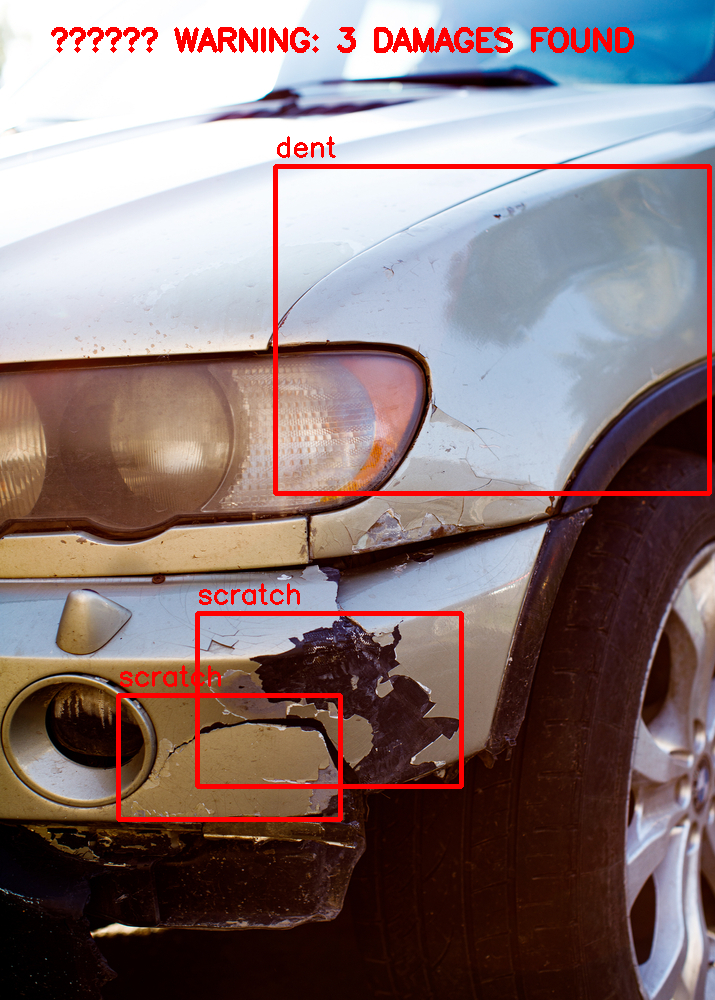

In [ ]:
# This line "calls" your demo logic to test an image
car_health_check('/content/dataset/images/val/003991.jpg')


image 1/1 /content/dataset/images/val/003995.jpg: 448x640 1 glass_shatter, 61.5ms
Speed: 3.3ms preprocess, 61.5ms inference, 4.0ms postprocess per image at shape (1, 3, 448, 640)


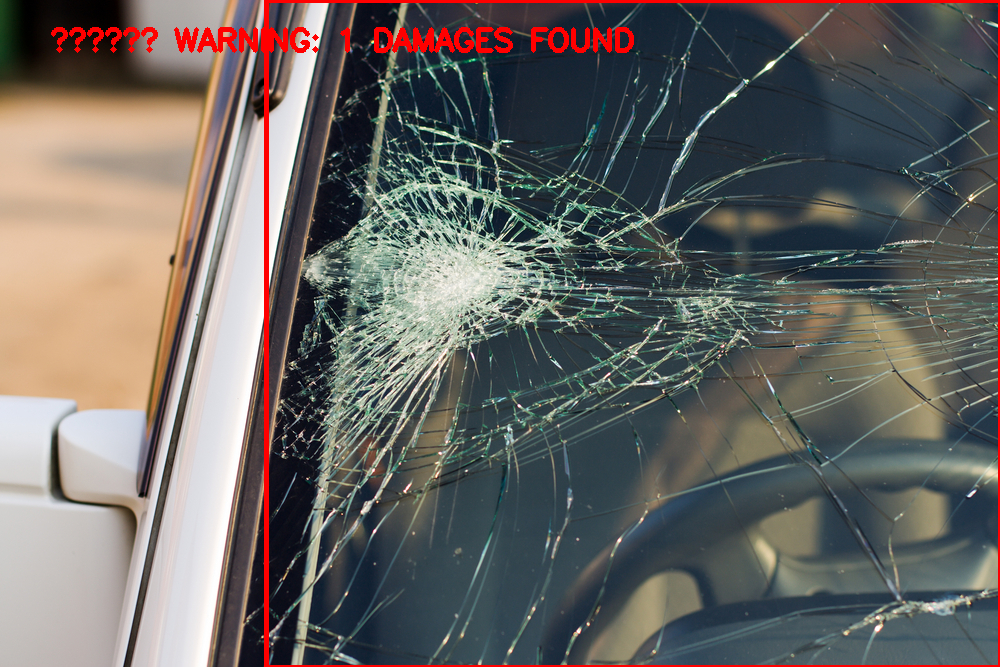

In [ ]:
# This line "calls" your demo logic to test an image
car_health_check('/content/dataset/images/val/003995.jpg')


image 1/1 /content/dataset/images/val/003938.jpg: 448x640 3 dents, 1 scratch, 15.8ms
Speed: 5.1ms preprocess, 15.8ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)


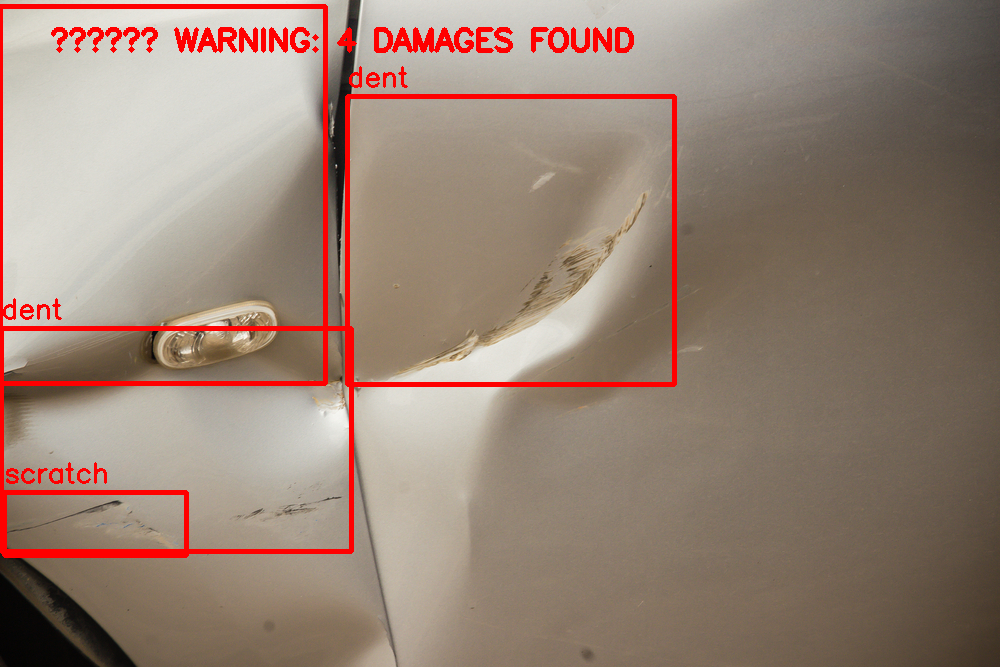

In [ ]:
# This line "calls" your demo logic to test an image
car_health_check('/content/dataset/images/val/003938.jpg')


image 1/1 /content/dataset/images/train/000066.jpg: 448x640 1 dent, 1 crack, 42.2ms
Speed: 2.5ms preprocess, 42.2ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


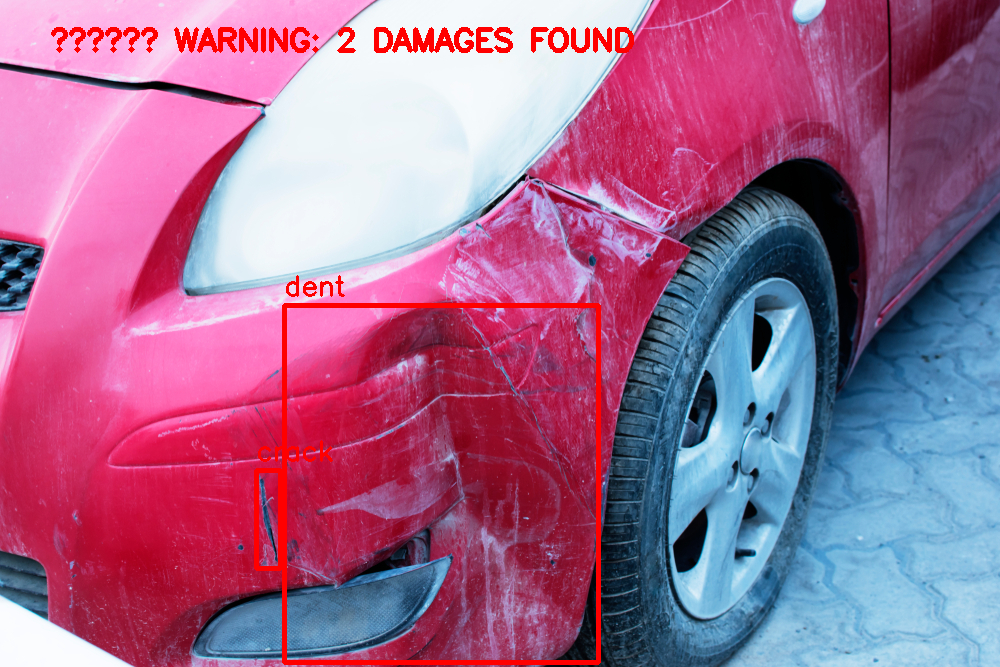

In [ ]:
# This line "calls" your demo logic to test an image
car_health_check('/content/dataset/images/train/000066.jpg')


image 1/1 /content/dataset/images/train/000065.jpg: 448x640 1 scratch, 7.0ms
Speed: 2.4ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


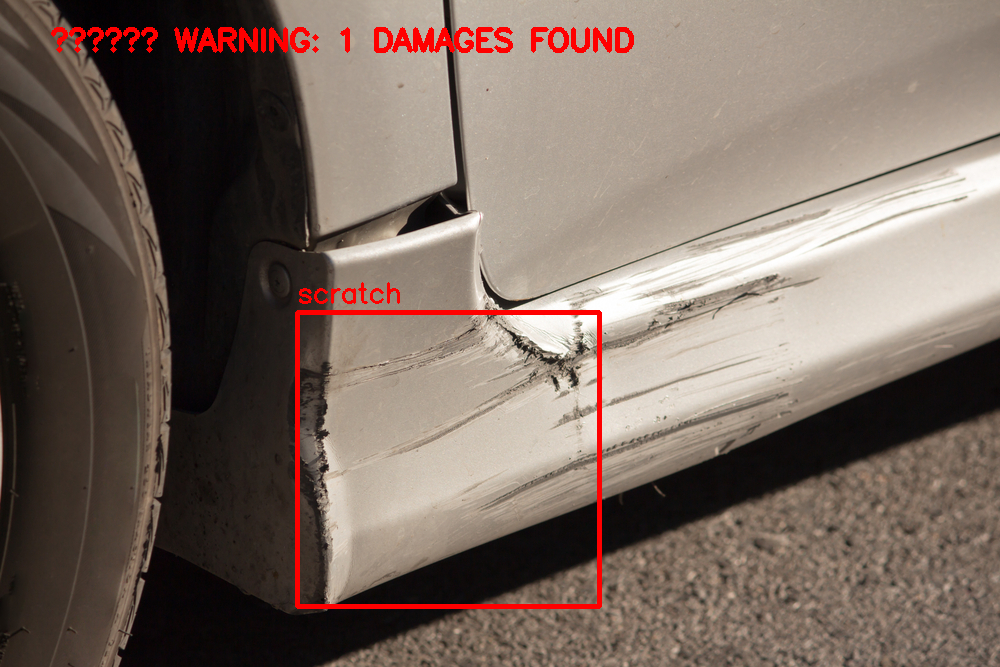

In [ ]:
car_health_check('/content/dataset/images/train/000065.jpg')


image 1/1 /content/dataset/images/train/000071.jpg: 448x640 2 scratchs, 1 lamp_broken, 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 2.9ms postprocess per image at shape (1, 3, 448, 640)


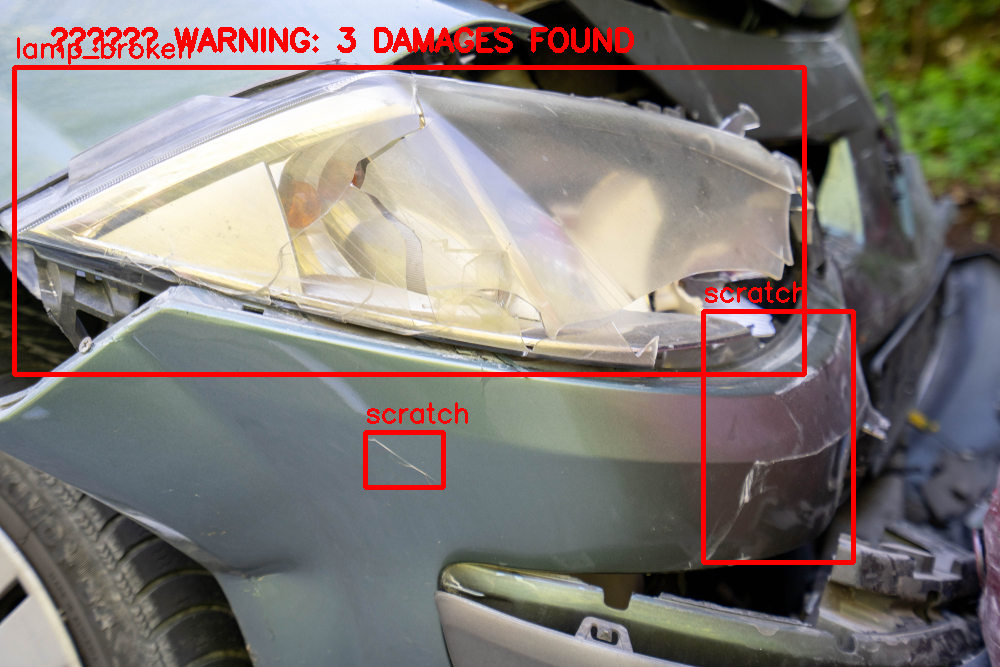

In [ ]:
car_health_check('/content/dataset/images/train/000071.jpg')


image 1/1 /content/dataset/images/train/000072.jpg: 448x640 2 scratchs, 6.7ms
Speed: 2.3ms preprocess, 6.7ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


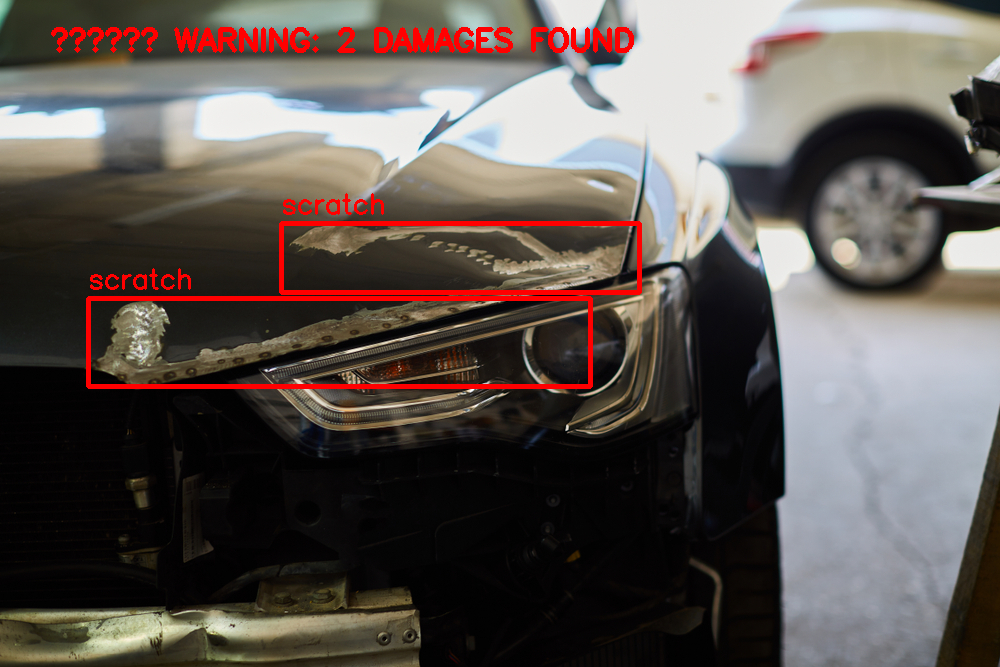

In [ ]:
car_health_check('/content/dataset/images/train/000072.jpg')


image 1/1 /content/dataset/images/train/000275.jpg: 448x640 1 lamp_broken, 6.9ms
Speed: 2.5ms preprocess, 6.9ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


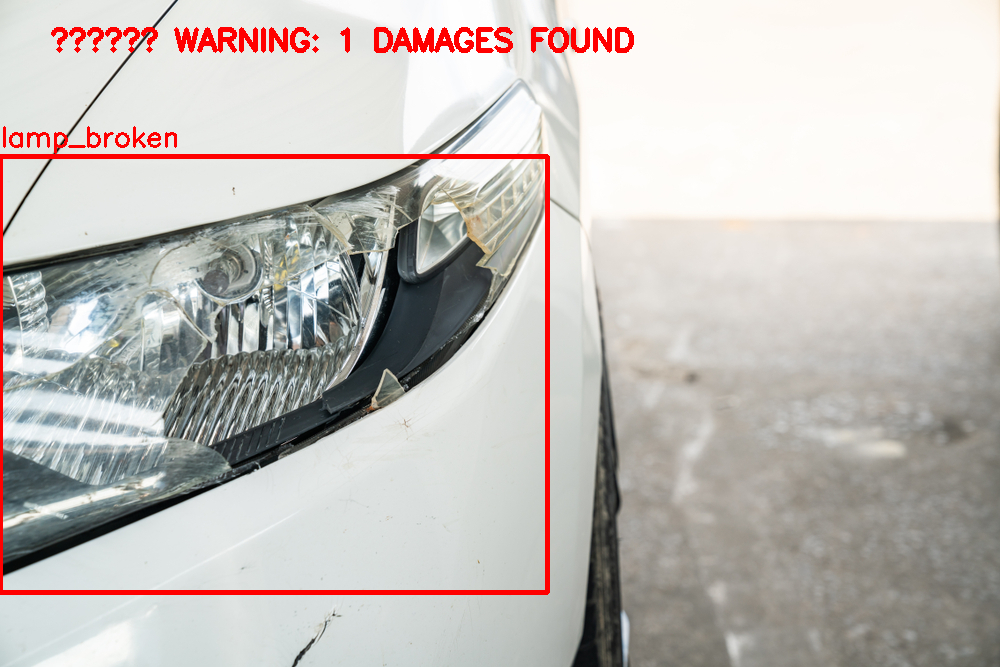

In [ ]:
car_health_check('/content/dataset/images/train/000275.jpg')


image 1/1 /content/dataset/images/train/00294.jpg: 416x640 (no detections), 43.2ms
Speed: 2.5ms preprocess, 43.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


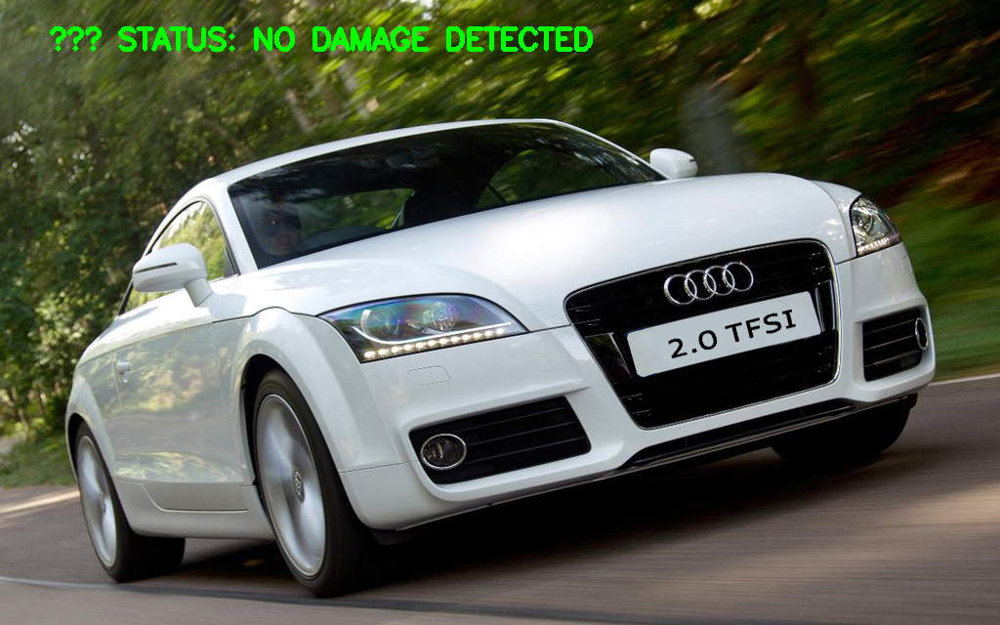

In [ ]:
car_health_check('/content/dataset/images/train/00294.jpg')

In [ ]:
import os
# Look for the most recent training run
run_dir = '/content/runs/detect/train/weights/best.pt'
if os.path.exists(run_dir):
    print(f"✅ Found it! Use this path in app.py: {run_dir}")
else:
    # Check your previous run name if you renamed it
    print("❌ Not found in 'train'. Checking 'car_damage_final'...")
    !find /content/runs -name "best.pt"

❌ Not found in 'train'. Checking 'car_damage_final'...
/content/runs/detect/car_damage_final/weights/best.pt


In [ ]:
import os
# Search for any 'best.pt' file in the runs folder
!find /content/runs -name "best.pt"

find: ‘/content/runs’: No such file or directory


In [ ]:
import os

# This lists all folders in runs/detect to help you find the latest one
if os.path.exists('/content/runs/detect/'):
    print("Available training runs:", os.listdir('/content/runs/detect/'))

# This finds the actual file path for you
!find /content/runs -name "best.pt"

find: ‘/content/runs’: No such file or directory


In [18]:
from ultralytics import YOLO

# 1. Load the model
model = YOLO('yolov8n.pt')

# 2. Train for 50 epochs
# We name it 'car_damage_50e' so the weights go to a predictable folder
model.train(
    data='/content/local_dataset.yaml',
    epochs=50,
    imgsz=640,
    batch=16,
    name='car_damage_50e'
)

# 3. IMMEDIATELY save the model to your Google Drive so it's permanent
!mkdir -p "{DRIVE_PATH}/Final_Weights"
!cp /content/runs/detect/car_damage_50e/weights/best.pt "{DRIVE_PATH}/Final_Weights/best_50e.pt"
print("✅ Training complete. Model brain saved to Google Drive.")

Ultralytics 8.3.245 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/local_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=car_damage_50e2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tru

In [19]:
# Create a dedicated folder in your Drive
!mkdir -p "{DRIVE_PATH}/Final_Car_Damage_Model"

# Copy the final 50-epoch weights
!cp /content/runs/detect/car_damage_50e2/weights/best.pt "{DRIVE_PATH}/Final_Car_Damage_Model/car_damage_best.pt"

print("✅ Final 50-epoch model saved to Google Drive.")

✅ Final 50-epoch model saved to Google Drive.


In [27]:
!find /content -name "*.pt"

/content/yolo11n.pt
/content/runs/detect/car_damage_50e/weights/best.pt
/content/runs/detect/car_damage_50e/weights/last.pt
/content/runs/detect/car_damage_50e2/weights/best.pt
/content/runs/detect/car_damage_50e2/weights/last.pt
/content/yolov8n.pt
/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/Final_Model/car_damage_best.pt
/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/Final_Weights/best_50e.pt
/content/drive/MyDrive/AI_Projects/Car_Damage_Detection/Final_Car_Damage_Model/car_damage_best.pt
find: ‘/content/drive/.Encrypted/.shortcut-targets-by-id/16g4j579wOOXs9l9GO07b479SRr4RirsR/Organic Short Notes’: No such file or directory
find: ‘/content/drive/.Encrypted/.shortcut-targets-by-id/1_8uih-ttA1pS0qravSTxf0adyBqYLGpy/Chapters’: No such file or directory
find: ‘/content/drive/.Encrypted/.shortcut-targets-by-id/1ofr6mgy_Dep3J6gInEWMhbkGjdlgecKr/Marathi ebooks’: No such file or directory
find: ‘/content/drive/.Encrypted/.shortcut-targets-by-id/1XIIlbKXmJXrdRzS_jabEM-qE

In [28]:
# Create a permanent folder in your Drive
!mkdir -p "/content/drive/MyDrive/Final_Car_Damage_Model"

# Copy the weights you found in image_0ecbcd.png
!cp /content/runs/detect/car_damage_50e2/weights/best.pt "/content/drive/MyDrive/Final_Car_Damage_Model/car_damage_best.pt"
print("✅ SUCCESS: Your 50-epoch brain is safely in Google Drive.")

✅ SUCCESS: Your 50-epoch brain is safely in Google Drive.


In [35]:
!pip install gradio ultralytics -q

In [37]:
import gradio as gr
from ultralytics import YOLO
import PIL.Image as Image

# Load your 50-epoch model weights
model = YOLO('/content/drive/MyDrive/Final_Car_Damage_Model/car_damage_best.pt')

def predict_damage(img):
    # Run the model on the uploaded image
    results = model.predict(source=img, conf=0.25)

    # Logic: Draw boxes on the image
    for r in results:
        im_array = r.plot()  # Create an array with boxes drawn
        # Convert BGR (OpenCV default) to RGB (Gradio/PIL default)
        im_rgb = Image.fromarray(im_array[..., ::-1])

    status = "✅ CLEAN" if len(results[0].boxes) == 0 else f"⚠️ {len(results[0].boxes)} DAMAGES"
    return im_rgb, status

In [40]:
demo = gr.Interface(
    fn=predict_damage,
    inputs=gr.Image(type="pil", label="Upload Car Photo"),
    outputs=[gr.Image(type="pil", label="Result"), gr.Textbox(label="Status")],
    title="🚗 Smart Car Damage Detector",
    description="Upload a photo to instantly identify dents, scratches, or cracks."
)

In [41]:
demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://e74ba5bad131df596f.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
